## Faltung mit Bildern

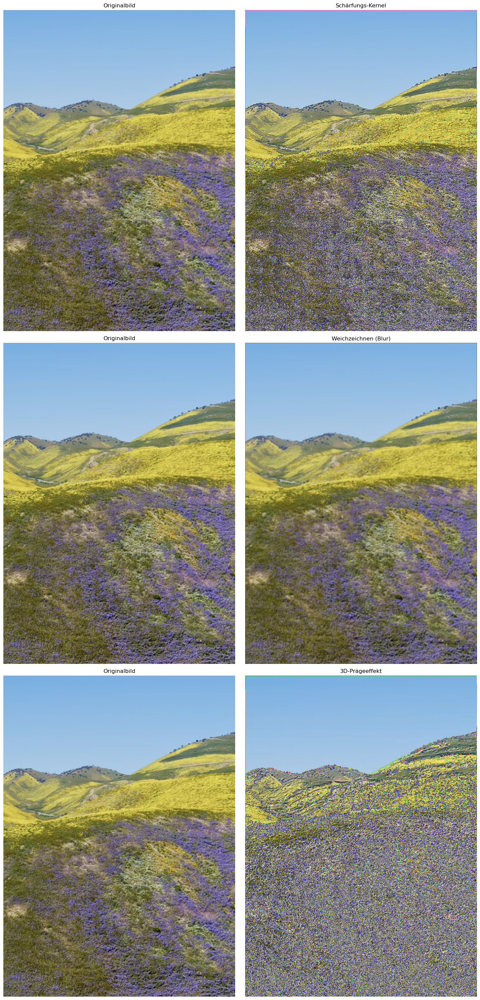

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from PIL import Image

# Funktion zum Laden des Bildes
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    return np.array(image)

# Funktion zur Anwendung der Faltung auf jeden Farbkanal separat
def apply_convolution(image, kernel):
    convolved_image = np.zeros_like(image)
    for i in range(3):
        convolved_image[:, :, i] = convolve2d(image[:, :, i], kernel, mode='same', boundary='fill', fillvalue=0)
    return convolved_image

# Funktion zur Visualisierung der Bilder
def plot_images(original, convolved_images, titles):
    fig, axes = plt.subplots(len(convolved_images), 2, figsize=(15, 10 * len(convolved_images)))
    
    
    for i, convolved_image in enumerate(convolved_images):
        axes[i][0].imshow(original)
        axes[i][0].set_title('Originalbild')
        axes[i][0].axis('off')
        axes[i][1].imshow(convolved_image)
        axes[i][1].set_title(titles[i])
        axes[i][1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Hauptprogramm
if __name__ == "__main__":
    image_path = 'dein_bild3.png'  # Passe den Bildpfad entsprechend an
    image = load_image(image_path)
    
    # Definition der Kernel für verschiedene Effekte
    kernels = [
        np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]),  # Schärfungs-Kernel
        np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]]) / 9,  # Weichzeichnen (Blur)
        np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])   # 3D-Prägeeffekt
    ]
    
    # Anwenden der Faltung auf jedes Bild mit jedem Kernel
    convolved_images = [apply_convolution(image, kernel) for kernel in kernels]
    
    # Titel für die subplots
    titles = ['Schärfungs-Kernel', 'Weichzeichnen (Blur)', '3D-Prägeeffekt']
    
    # Visualisierung der Bilder
    plot_images(image, convolved_images, titles)

## Kantendetection


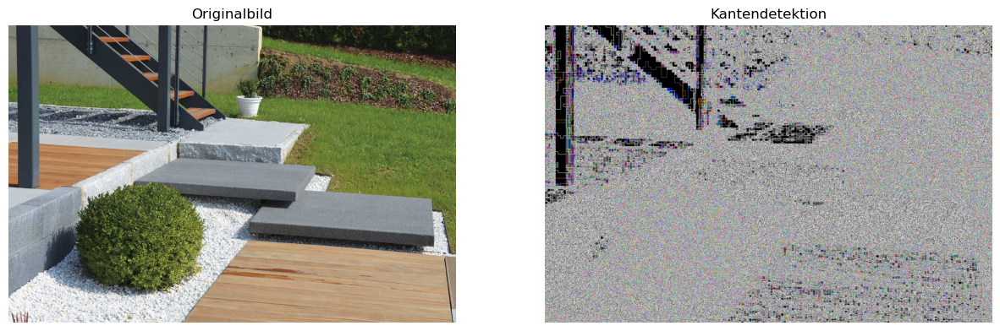

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from PIL import Image

# Lade das Bild
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Lade das Bild in Farbe (RGB)
    return np.array(image)

# Führe die Faltung auf jeden Farbkanal separat durch
def apply_convolution(image, kernel):
    convolved_image = np.zeros_like(image)
    for i in range(3):
        convolved_image[:, :, i] = convolve2d(image[:, :, i], kernel, mode='same', boundary='fill', fillvalue=0)
    return convolved_image

# Kombiniere die horizontalen und vertikalen Kanten
def detect_edges(image):
    # Sobel-Filter für horizontale und vertikale Kanten
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])

    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])

    # Faltung anwenden
    edges_x = apply_convolution(image, sobel_x)
    edges_y = apply_convolution(image, sobel_y)

    # Kanten kombinieren
    edges = np.sqrt(edges_x**2 + edges_y**2)
    edges = (edges / np.max(edges) * 255).astype(np.uint8)  # Normalisierung

    return edges

# Visualisiere das Original und das Kantenbild
def plot_images(original, edges):
    fig, axes = plt.subplots(1, 2, figsize=(15, 30))
    axes[0].imshow(original)
    axes[0].set_title('Originalbild')
    axes[0].axis('off')
    
    axes[1].imshow(edges)
    axes[1].set_title('Kantendetektion')
    axes[1].axis('off')
    
    plt.show()

# Hauptprogramm
if __name__ == "__main__":
    image_path = 'kante.jpg'  # Ersetze dies durch den Pfad zu deinem Bild
    image = load_image(image_path)
    
    # Kanten im Bild detektieren
    edges = detect_edges(image)
    
    plot_images(image, edges)


## Faltung von 2 Bildern miteinander

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from PIL import Image
from skimage.transform import resize

# Funktion zum Laden eines Bildes
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    return np.array(image)

# Funktion zur Anwendung der Faltung auf jeden Farbkanal separat
def apply_convolution(image, kernel):
    convolved_image = np.zeros_like(image)
    for i in range(3):
        convolved_image[:, :, i] = convolve2d(image[:, :, i], kernel, mode='same', boundary='fill', fillvalue=0)
    return convolved_image

# Funktion zur Visualisierung der Bilder
def plot_images(original1, original2, convolved_image, title):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(original1)
    axes[0].set_title('Originalbild 1')
    axes[0].axis('off')
    
    axes[1].imshow(original2)
    axes[1].set_title('Originalbild 2')
    axes[1].axis('off')
    
    axes[2].imshow(convolved_image)
    axes[2].set_title(title)
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Hauptprogramm
if __name__ == "__main__":
    image_path1 = 'Bild5.png'  # Pfade zu den Bildern anpassen
    image_path2 = 'Bild6.png'
    
    image1 = load_image(image_path1)
    image2 = load_image(image_path2)
    
    # Resampling des größeren Bildes auf die Größe des kleineren Bildes
    if image1.size > image2.size:
        image1 = resize(image1, image2.shape[:2], preserve_range=True).astype(np.uint8)
    else:
        image2 = resize(image2, image1.shape[:2], preserve_range=True).astype(np.uint8)
    
    # Beispiel-Kernel für die Faltung
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    
    # Anwendung der Faltung auf jeden Farbkanal separat für beide Bilder
    convolved_image1 = apply_convolution(image1, kernel)
    convolved_image2 = apply_convolution(image2, kernel)
    
    # Kombination der gefalteten Bilder (hier einfach als Summe der Bilder)
    combined_convolved_image = np.clip(convolved_image1 + convolved_image2, 0, 255).astype(np.uint8)
    
    # Visualisierung der Originalbilder und des kombinierten gefalteten Bildes
    plot_images(image1, image2, combined_convolved_image, 'Kombiniertes gefaltetes Bild')


FileNotFoundError: [Errno 2] No such file or directory: 'Bild6.png'

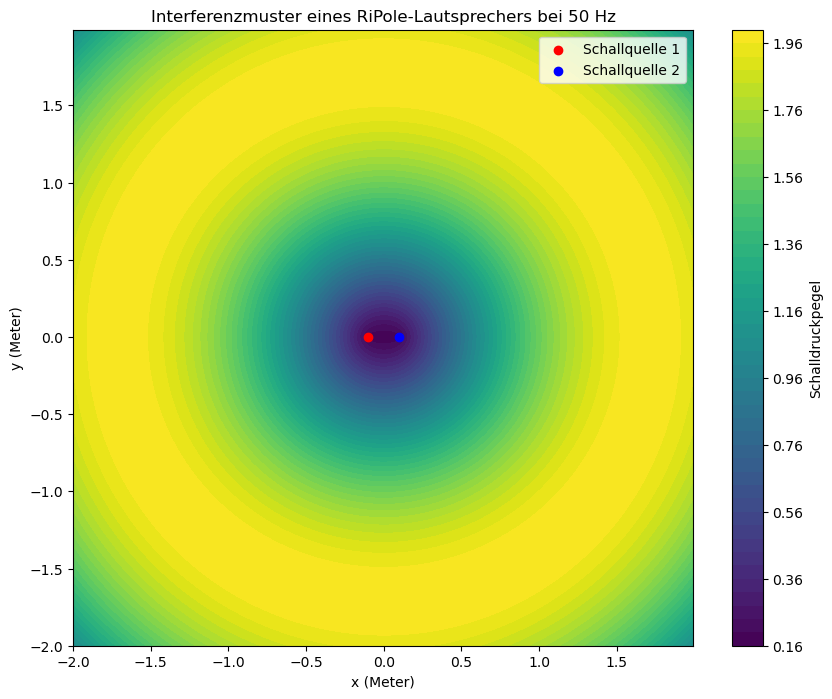